<a href="https://colab.research.google.com/github/Niko2039/Tree-Nuts--Image-Classification/blob/main/Tree_Nuts_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [41]:
!unzip nuts.zip

Archive:  nuts.zip
replace nuts_100.0.h5? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [42]:
import numpy as np
import pandas as pd

In [43]:
data_csv=pd.read_csv("/content/tree nuts.csv")

In [44]:
data_csv.head(5)

,class index,filepaths,labels,data set
0,0,train/almonds/001.jpg,almonds,train
1,0,train/almonds/002.jpg,almonds,train
2,0,train/almonds/003.jpg,almonds,train
3,0,train/almonds/004.jpg,almonds,train
4,0,train/almonds/005.jpg,almonds,train


In [45]:
print(f"Total number of Classes is : {len(data_csv.labels.unique())}")

Total number of Classes is : 10


In [46]:
import matplotlib.pyplot as plt
from os import listdir
from sklearn.preprocessing import LabelBinarizer 
import random
from matplotlib.image import imread

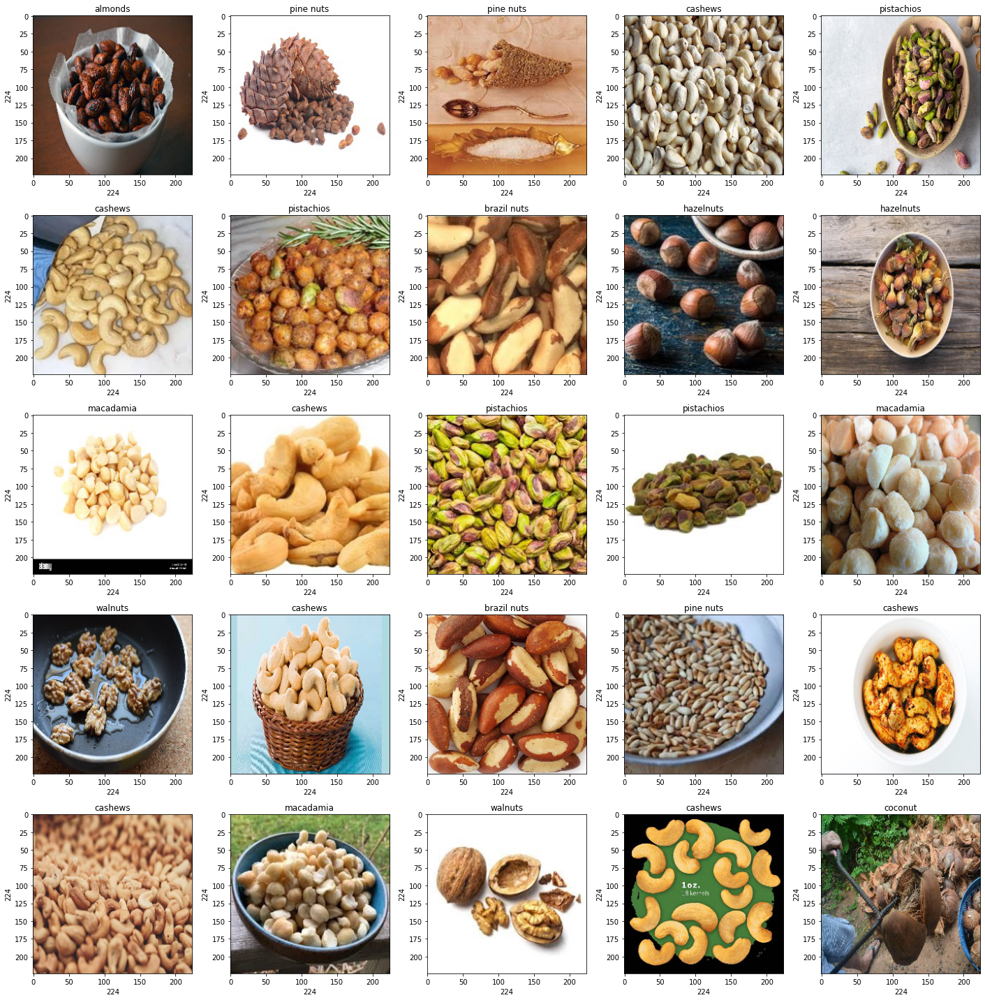

In [47]:
plt.figure(figsize=(20,20))
path = "/content/train/"
for i in range(1,26):
    plt.subplot(5,5,i)
    plt.tight_layout()
    selected_folder=random.choice(sorted(listdir(path)))
    rand_img = imread(path +selected_folder+ '/'+random.choice(listdir(path+selected_folder)))
    plt.imshow(rand_img)
    plt.title(str(selected_folder))
    plt.xlabel(rand_img.shape[1], fontsize = 10)
    plt.ylabel(rand_img.shape[0], fontsize = 10)

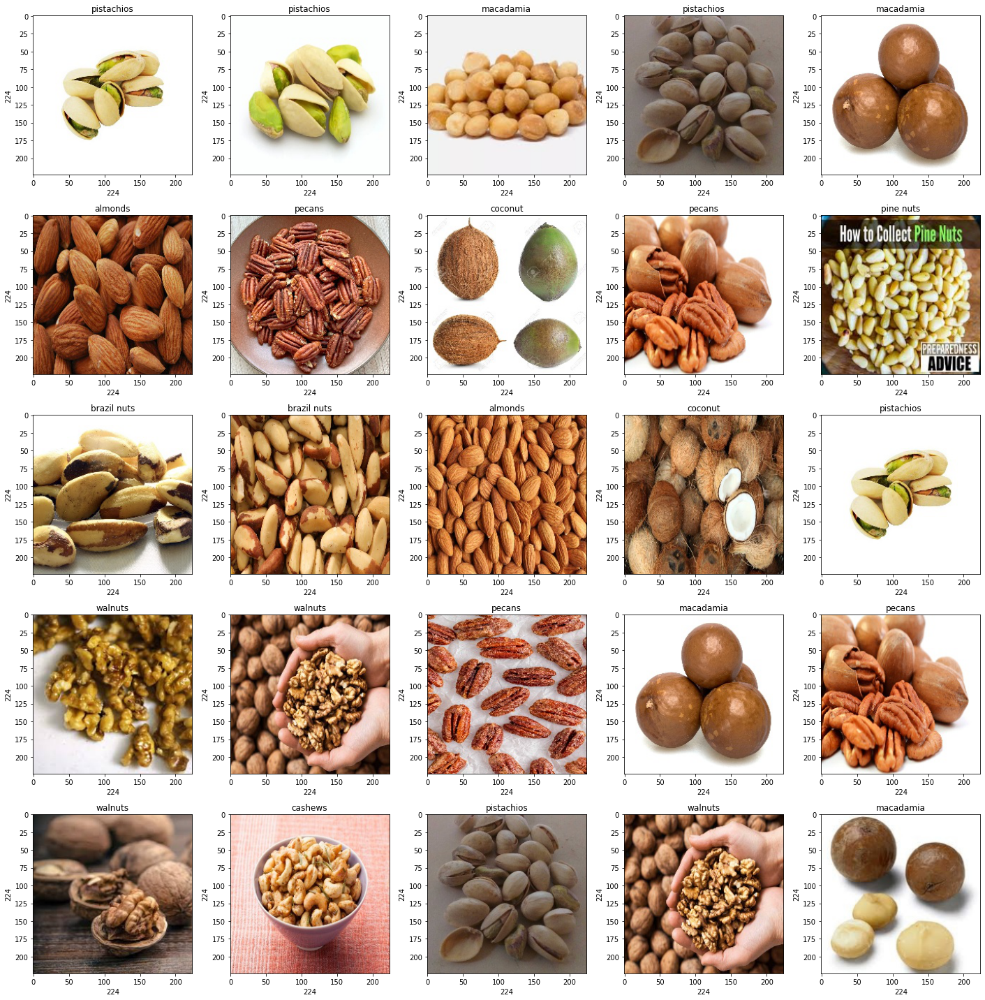

In [48]:
plt.figure(figsize=(20,20))
path = "/content/test/"
for i in range(1,26):
    plt.subplot(5,5,i)
    plt.tight_layout()
    selected_folder=random.choice(sorted(listdir(path)))
    rand_img = imread(path +selected_folder+ '/'+random.choice(listdir(path+selected_folder)))
    plt.imshow(rand_img)
    plt.title(str(selected_folder))
    plt.xlabel(rand_img.shape[1], fontsize = 10)
    plt.ylabel(rand_img.shape[0], fontsize = 10)

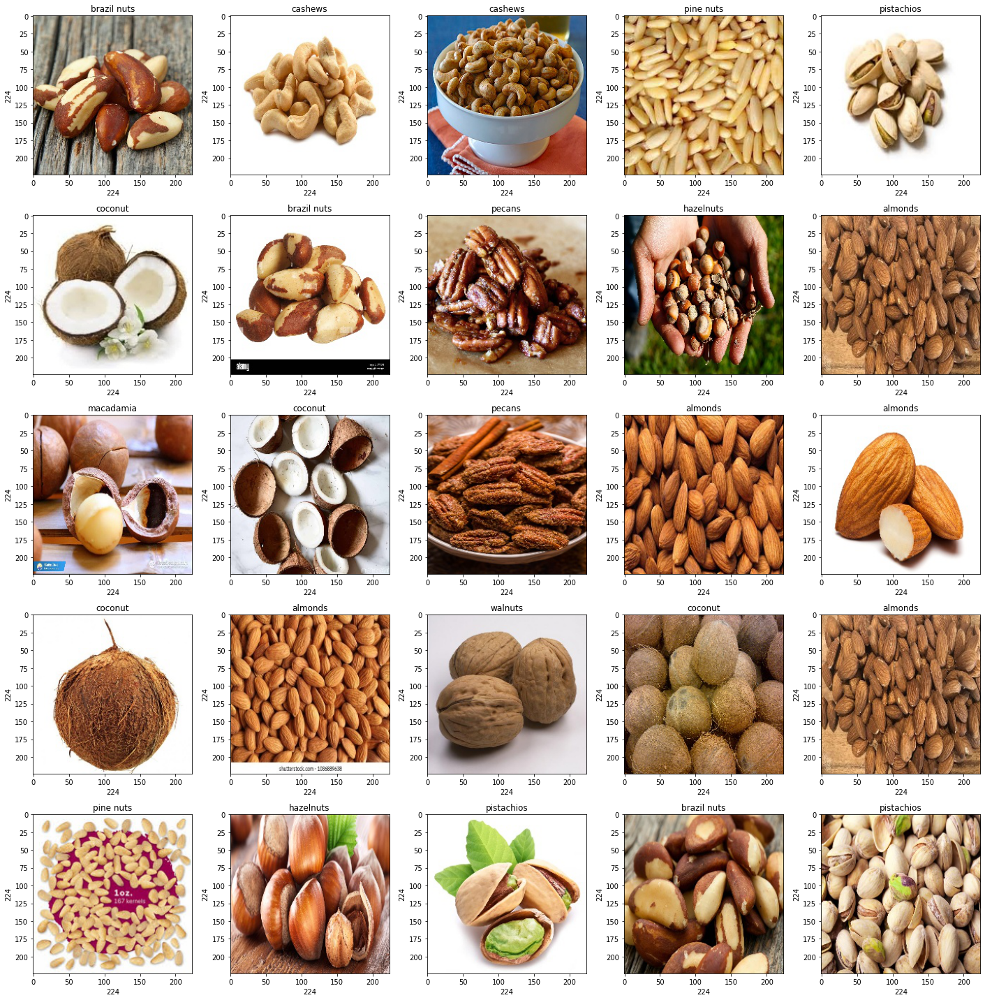

In [49]:
plt.figure(figsize=(20,20))
path = "/content/valid/"
for i in range(1,26):
    plt.subplot(5,5,i)
    plt.tight_layout()
    selected_folder=random.choice(sorted(listdir(path)))
    rand_img = imread(path +selected_folder+ '/'+random.choice(listdir(path+selected_folder)))
    plt.imshow(rand_img)
    plt.title(str(selected_folder))
    plt.xlabel(rand_img.shape[1], fontsize = 10)
    plt.ylabel(rand_img.shape[0], fontsize = 10)

In [50]:
from PIL import Image
from tensorflow.keras.utils import img_to_array, array_to_img
from keras.preprocessing import image

In [51]:
training_image_list,training_label_list=[],[]

In [52]:
main_directory="/content/train"
list_main_dir=listdir(main_directory)

for each in list_main_dir:
    imageslist=listdir(main_directory+'/'+each+'/') 
    print(f"Images of {each } directory is loading....")
    for each_images in imageslist:
        i=Image.open(f'{main_directory}/{each}/{each_images}')
        i=i.resize((224 ,224 ))
        image_array_format=img_to_array(i)
        training_image_list.append(image_array_format)
        training_label_list.append(each)

Images of pine nuts directory is loading....
Images of brazil nuts directory is loading....
Images of pistachios directory is loading....
Images of cashews directory is loading....
Images of pecans directory is loading....
Images of almonds directory is loading....
Images of hazelnuts directory is loading....
Images of walnuts directory is loading....
Images of macadamia directory is loading....
Images of coconut directory is loading....


In [53]:
total_Image_category_count=pd.DataFrame(training_label_list).value_counts()
total_Image_category_count

pecans         161
brazil nuts    138
cashews        136
hazelnuts      120
pistachios     110
almonds        109
macadamia      101
pine nuts       98
walnuts         96
coconut         94
dtype: int64

In [54]:
lb = LabelBinarizer()
train_y = lb.fit_transform(training_label_list)
print(lb.classes_)
train_y[1]

['almonds' 'brazil nuts' 'cashews' 'coconut' 'hazelnuts' 'macadamia'
 'pecans' 'pine nuts' 'pistachios' 'walnuts']


array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0])

In [55]:
Validation_image_list,Validation_label_list=[],[]

In [56]:
main_directory="/content/valid"
list_main_dir=listdir(main_directory)

for each in list_main_dir:
    imageslist=listdir(main_directory+'/'+each+'/') 
    print(f"Images of {each } directory is loading....")
    for each_images in imageslist:
        i=Image.open(f'{main_directory}/{each}/{each_images}')
        i = i.resize((224 ,224 ))
        image_array_format=img_to_array(i)
        Validation_image_list.append(image_array_format)
        Validation_label_list.append(each)

Images of pine nuts directory is loading....
Images of brazil nuts directory is loading....
Images of pistachios directory is loading....
Images of cashews directory is loading....
Images of pecans directory is loading....
Images of almonds directory is loading....
Images of hazelnuts directory is loading....
Images of walnuts directory is loading....
Images of macadamia directory is loading....
Images of coconut directory is loading....


In [57]:
total_Image_category_count=pd.DataFrame(Validation_label_list).value_counts()
total_Image_category_count

almonds        5
brazil nuts    5
cashews        5
coconut        5
hazelnuts      5
macadamia      5
pecans         5
pine nuts      5
pistachios     5
walnuts        5
dtype: int64

In [58]:
lb = LabelBinarizer()
validation_y = lb.fit_transform(Validation_label_list)
print(lb.classes_)
validation_y[1]

['almonds' 'brazil nuts' 'cashews' 'coconut' 'hazelnuts' 'macadamia'
 'pecans' 'pine nuts' 'pistachios' 'walnuts']


array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0])

In [59]:
Test_image_list,Test_label_list=[],[]

In [60]:
main_directory="/content/test"
list_main_dir=listdir(main_directory)

for each in list_main_dir:
    imageslist=listdir(main_directory+'/'+each+'/') 
    print(f"Images of {each } directory is loading....")
    for each_images in imageslist:
        i=Image.open(f'{main_directory}/{each}/{each_images}')
        i = i.resize((224 ,224 ))
        image_array_format=img_to_array(i)
        Test_image_list.append(image_array_format)
        Test_label_list.append(each)

Images of pine nuts directory is loading....
Images of brazil nuts directory is loading....
Images of pistachios directory is loading....
Images of cashews directory is loading....
Images of pecans directory is loading....
Images of almonds directory is loading....
Images of hazelnuts directory is loading....
Images of walnuts directory is loading....
Images of macadamia directory is loading....
Images of coconut directory is loading....


In [61]:
total_Image_category_count=pd.DataFrame(Test_label_list).value_counts()
total_Image_category_count

almonds        5
brazil nuts    5
cashews        5
coconut        5
hazelnuts      5
macadamia      5
pecans         5
pine nuts      5
pistachios     5
walnuts        5
dtype: int64

In [62]:
lb = LabelBinarizer()
Test_y = lb.fit_transform(Test_label_list)
print(lb.classes_)
Test_y[1]

['almonds' 'brazil nuts' 'cashews' 'coconut' 'hazelnuts' 'macadamia'
 'pecans' 'pine nuts' 'pistachios' 'walnuts']


array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0])

In [63]:
print(f"total images in training data {len(training_image_list)} and its labels {len(training_label_list)}") 
print(f"total images in Validation data {len(Validation_image_list)} and its labels {len(Validation_label_list)}")
print(f"total images in Testing  data {len(Test_image_list)} and its labels {len(Test_label_list)}") 

total images in training data 1163 and its labels 1163
total images in Validation data 50 and its labels 50
total images in Testing  data 50 and its labels 50


In [64]:
from sklearn.utils import shuffle
training_image_list, train_y = shuffle(training_image_list, train_y, random_state=0)
Test_image_list, Test_y = shuffle(Test_image_list, Test_y, random_state=0)
Validation_image_list, validation_y= shuffle(Validation_image_list, validation_y, random_state=0)

In [65]:
!pip install ipyplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/



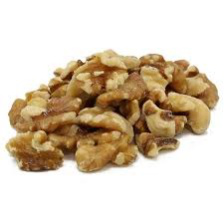
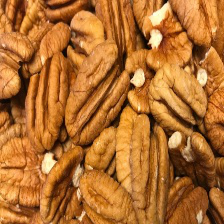
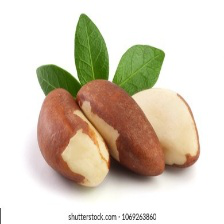
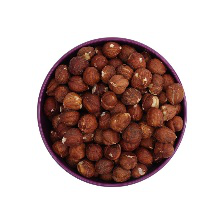
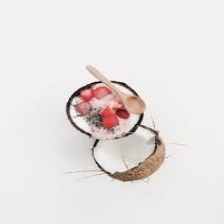
...
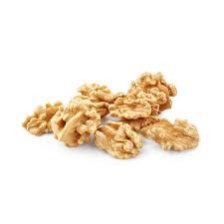
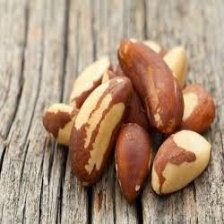
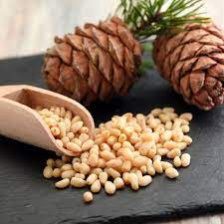
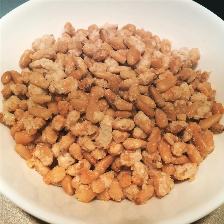
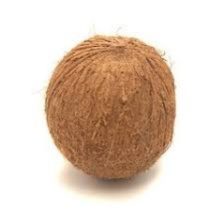

In [66]:
import ipyplot
ipyplot.plot_images(training_image_list, max_images=20,img_width=200,labels=train_y)


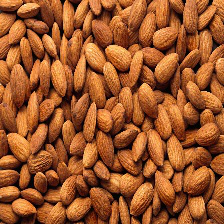
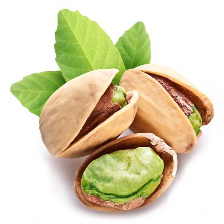
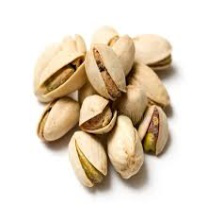
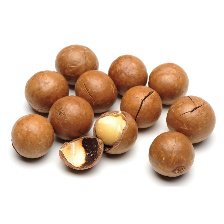
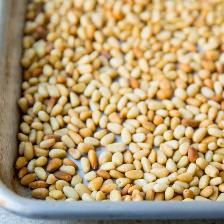
...
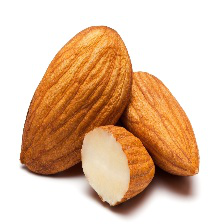
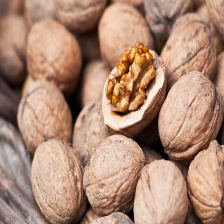
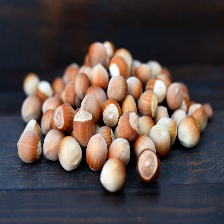
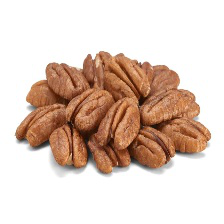
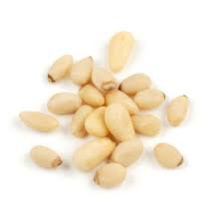

In [67]:
import ipyplot
ipyplot.plot_images(Validation_image_list, max_images=10,img_width=200,labels=validation_y)


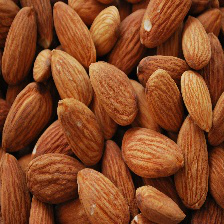
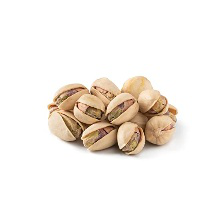
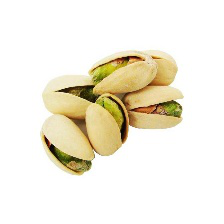
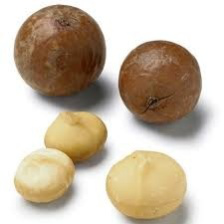
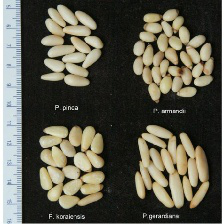
...
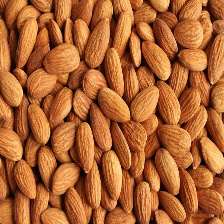
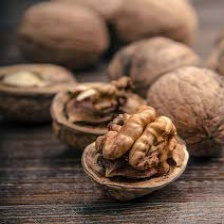
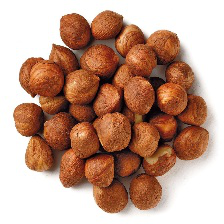
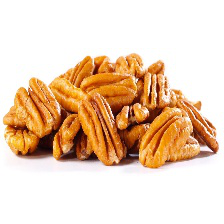
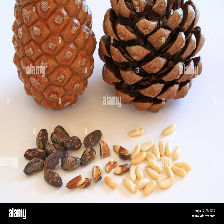

In [68]:
import ipyplot
ipyplot.plot_images(Test_image_list, max_images=10,img_width=200,labels=Test_y)

In [69]:
training_image_list = np.array(training_image_list, dtype=np.float16) / 225.0
Test_image_list = np.array(Test_image_list, dtype=np.float16) / 225.0
Validation_image_list = np.array(Validation_image_list, dtype=np.float16) / 225.0

training_image_list = training_image_list.reshape( -1,224,224,3)
Test_image_list = Test_image_list.reshape( -1,224,224,3)
Validation_image_list = Validation_image_list.reshape( -1,224,224,3)

In [70]:
from keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from keras.layers import Conv2D, MaxPooling2D, Activation, Flatten, Dropout, Dense, LeakyReLU

In [71]:
import tensorflow as tf
model = Sequential()
model.add(Conv2D(224, (3, 3), padding="same",input_shape=(224,224,3), activation="relu"))
model.add(MaxPooling2D(pool_size=(3, 3)))
model.add(Conv2D(120, (3, 3), padding="same", activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(70, (3, 3), padding="same", activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())

model.add(Dense(10, activation="softmax"))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 224, 224, 224)     6272      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 74, 74, 224)      0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 74, 74, 120)       242040    
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 37, 37, 120)      0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 37, 37, 70)        75670     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 18, 18, 70)      

In [72]:
import tensorflow as tf
print("--> Checking for physical Tensorflow devices")
for device in tf.config.list_physical_devices():
    print(": {}".format(device.name))

--> Checking for physical Tensorflow devices
: /physical_device:CPU:0
: /physical_device:GPU:0


In [73]:
import tensorflow as tf
with tf.device('/GPU:0'):
    model.compile(optimizer='adam',loss = 'categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(training_image_list, train_y, batch_size = 32, epochs = 10,validation_data=(Validation_image_list,validation_y))

Epoch 1/10
37/37 [==============================] - 7s 156ms/step - loss: 2.3268 - accuracy: 0.1204 - val_loss: 2.2984 - val_accuracy: 0.1200
Epoch 2/10
37/37 [==============================] - 5s 149ms/step - loss: 2.2474 - accuracy: 0.1496 - val_loss: 2.2777 - val_accuracy: 0.1400
Epoch 3/10
37/37 [==============================] - 6s 149ms/step - loss: 2.1836 - accuracy: 0.1754 - val_loss: 2.2884 - val_accuracy: 0.1400
Epoch 4/10
37/37 [==============================] - 6s 156ms/step - loss: 2.1415 - accuracy: 0.2175 - val_loss: 2.2868 - val_accuracy: 0.1400
Epoch 5/10
37/37 [==============================] - 5s 145ms/step - loss: 2.0306 - accuracy: 0.2683 - val_loss: 2.2348 - val_accuracy: 0.1200
Epoch 6/10
37/37 [==============================] - 5s 140ms/step - loss: 1.7929 - accuracy: 0.3680 - val_loss: 2.1081 - val_accuracy: 0.2000
Epoch 7/10
37/37 [==============================] - 5s 142ms/step - loss: 1.4570 - accuracy: 0.4961 - val_loss: 2.5316 - val_accuracy: 0.1600
Epoch 

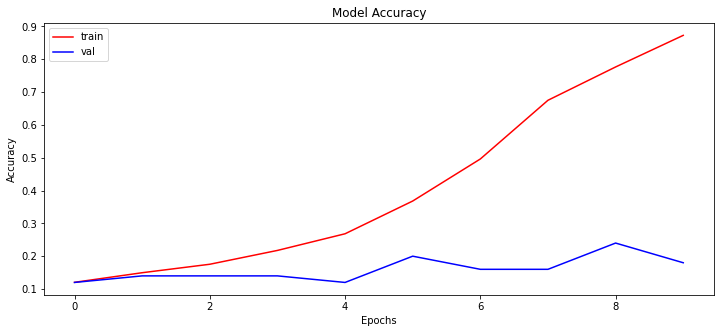

In [74]:
plt.figure(figsize=(12, 5))
plt.plot(history.history['accuracy'], color='r')
plt.plot(history.history['val_accuracy'], color='b')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'val'])
plt.show()

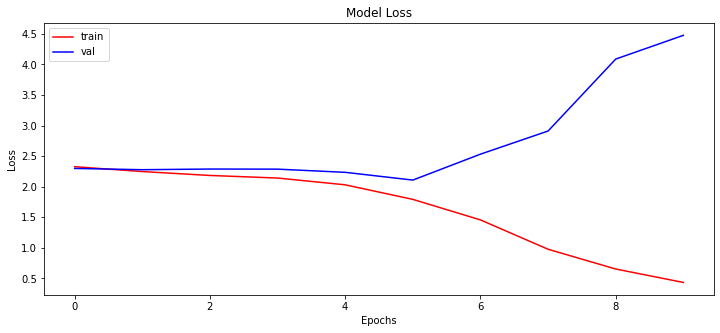

In [75]:
plt.figure(figsize=(12, 5))
plt.plot(history.history['loss'], color='r')
plt.plot(history.history['val_loss'], color='b')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'val'])

plt.show()

In [76]:
scores = model.evaluate(Test_image_list, Test_y)
print(f"Test Accuracy: {scores[1]*100}")

2/2 [==============================] - 0s 34ms/step - loss: 6.0663 - accuracy: 0.0600
Test Accuracy: 5.999999865889549
